# Connect to comet

In [1]:
# # import comet_ml at the top of your file
# from comet_ml import Experiment

# # Create an experiment with your api key
# experiment = Experiment(
#     api_key="ZMIjNBttB9ueClB4Ovm4gHOsa",
#     project_name="thesis-test1-parallel-CNN",
#     workspace="loesverhaeghe",
#     log_code=True,
#     auto_metric_logging=True,
#     auto_param_logging=True,
#     log_graph=True,
#     auto_metric_step_rate=True,
#     parse_args=True,
#     auto_histogram_weight_logging=True,
#     auto_histogram_gradient_logging=True,
#     auto_histogram_activation_logging=True,
#     auto_histogram_epoch_rate=True,
# )


# Run model in WEST

In [2]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import os
import pandas as pd

import subprocess

import plotly.tools as tls
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import plotly
import plotly.graph_objs as go

import math  
import sklearn.metrics 

In [3]:
# # note: don't change any double backslashes (\\) to slashes (\) when you copy your local paths instead of the ones here
# # so if your local path is C:\model\project in this file you should put it as C:\\model\\project

# # this is the path to the West installation files
# path_to_west = "C:\\Program Files (x86)\\DHI\\WEST\\2022"

# # this is the path to the West project, the batch file should be created in the same directory as model files
# path_to_project = "C:\\Users\\Public\\Documents\\DHI\\WEST\\2022\\data\\projects\\data_gamze - ORIGINEEL - kopie\\pilEAUte model_Oct2022\\pilEAUte_model_ver04"
# # this will read all .Dynamic.ObjEval.Exp.xml files in your directory and make a list out of their names
# # useful if you have multiple of them for more scenarios (if you use scenarios withh different parameters for example)
# # the assumption is that you have already gone through the procedure for making .Dynamic.ObjEval.Exp.xml files 
# # for scenarios based on the parameters that need to be changed
# exp_filenames = []
# for files in os.listdir(path_to_project):
#     if files.endswith(".Dynamic.ObjEval.Exp.xml"):
#             exp_filenames.append(files)

# # print to see if it works
# print(exp_filenames) 

# # here the batch file will be created
# windows_batch_file = os.path.join(path_to_project, "run_model.bat")        

# # open the batch file and write the lines inside it
# fbat = open(windows_batch_file, "w")
# fbat.write("SET INCLUDE=%INCLUDE%;"+path_to_west+"\include\n")
# fbat.write("SET LIB=%LIB%;"+path_to_west+"\lib\win32-msvc\n")
# fbat.write("SET PATH="+path_to_west+"\\bin;"+path_to_west+"\\third_party\\bcc5.5\Bin;%PATH%\n")
# fbat.write("SET TORNADO_CC_PLATFORM=win32-bcc5.5\n")
# fbat.write("SET TORNADO_CC_PATH="+path_to_west+"\\third_party\\bcc5.5\n")
# fbat.write("SET TORNADO_DATA_PATH=C:\\Users\\Public\\Documents\\DHI\\WEST\\2022\n")
# fbat.write("SET TORNADO_ROOT_PATH="+path_to_west+"\n")
# fbat.write("SET OPENMODELICAHOME="+path_to_west+"\\bin\n")

# # up to here, the previous lines are for your machine to know where tornado files are stored

In [4]:
##########################################################################
# read this part only if you need to use tbuild command 
# for creating model files to run on linux (like for running on a cluster)
##########################################################################

# example for tbuild command, xxx is the path to the model block library, 
# you should keep External\External at the end of this path, just change the previous part 
# for example it should be something like this: C:\example\blocks\MSL\External\External
# _ProjectName_ is only the name of the project and not the complete path, the complete
# path is not required since you are already in the directory of the project

# fbat.write("tbuild -S C:\\Users\\sdaneshg\\OneDrive - UGent\\Desktop\\WEST_model_latest update\\WEST_model\\WEST\\data\\blocks\\WESTforKALLISTO - InfluentModel\\External\\External -B ”” _Influent_ > tbuild.log\n")

In [5]:

# ##########################################################################
# # this part is realted to using texec for running simulations
# ##########################################################################

# # EXPLANATION if you need to run tbuild first 
# # when you first run this batch script, keep this line as a comment
# # you need to run the tbuild first
# # after you run this with tbuild command successfully then open this file again
# # and comment the fbat.write("tbuild...") line and uncomment the line below
# # then run the script again to create batch file fo simulations

# # log_filename is the name of the log file (with .log extension) that you choose to save
# # exp_filename is the .Dynamic.ObjEval.Exp.xml file you have in your project directory
# # these two should be only names and not full path, you don't need the full path here
# # output_name_orig is the name of the output file you choose to save in WEST environment
# # this should work even if you have multiple ObjEval files for example: scen_1.Dynamic.ObjEval.Exp.xml, scen_2.Dynamic.ObjEval.Exp.xml , ...
# # this will create a texec command for each scenario to run and then rename the output file accordingly 
# # so they will not be overwritten

# output_name_orig = "testausel25_06.Dynamic.Simul.1.out.testLoes.txt" # this is how I named the output file created in WEST

# # This writes the lines to create the log-file and run the model
# for f in exp_filenames:
#     log_filename = f.split('.')[0] + ".log"
#     new_output_name = f.split('.')[0] + ".out_test21_04.txt"
#     fbat.write("texec -l \"" + log_filename  + "\" \"" + f+"\"\n")
#     fbat.write("ren \"" + output_name_orig + "\" \"" + new_output_name +"\"\n")

# # write exit and close the file
# fbat.write("EXIT")
# fbat.close()

## DON'T FORGET TO DELETE THE PREVIOUS 'NEW OUTPUT NAME' FILE BECAUSE IF THERE EXIST ALREADY ONE, THE NEW ONE WILL NOT BE OVERWRITTEN

In [6]:
# # When you use parallel model this doesn't have to be run everytime

# # run the command line of your computer inside python to run the batch file
# # this might take a while as the model runs
# os.chdir(path_to_project)

# p = subprocess.Popen("run_model.bat" , shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
# p.communicate()            

In [7]:
# define a function that can interpolate the data to the measurement data time points
def interp(df, new_index):
    """Return a new DataFrame with all columns values interpolated to the new_index values."""
    df_out = pd.DataFrame(index=new_index)
    df_out.index.name = df.index.name

    for colname, col in df.iteritems():
        df_out[colname] = np.interp(new_index, df.index, col)

    return df_out

# Import measurement data 

In [8]:
interpol_index=np.linspace(0,58.9208, num=8352) # every 10 minutes
interpol_index

array([0.00000000e+00, 7.05553826e-03, 1.41110765e-02, ...,
       5.89066889e+01, 5.89137445e+01, 5.89208000e+01])

In [9]:
# set the path the the data file in my computer
measured_data_path="C:\\Users\\Public\\Documents\\DHI\\WEST\\2022\\data\\projects\\data_gamze_aanpassingen_LOES\\pilEAUte model_Oct2022\\InputOutput\\Measured_data_5_tank_model_rev2.txt"

# read the file and delete unwanted columns
measured_data=pd.read_csv(measured_data_path, sep="\t", header=[2], low_memory=False)
measured_data=measured_data.drop(0)
measured_data=measured_data.drop(1)
measured_data=measured_data.set_index('t')
measured_data = measured_data.astype(float)

measured_data=interp(measured_data, interpol_index)

display(measured_data)

,.ASU_2.X_TSS,.SST_1.X_Under,.ASU_4.C(S_O),Temp,.Qair_Basin_4,.SST_1.C(S_NH)(1),.SST_1.C(S_NO3)(1),.SST_1.X_Out
t,,,,,,,,
0.000000,3136.849400,6256.418700,3.000000,20.290100,331.000000,0.1,6.995200,0.000000
0.007056,3136.869454,6256.418700,3.000000,20.296348,328.009672,0.1,6.994067,0.000000
0.014111,3128.331916,6256.418700,3.000000,20.301719,326.718397,0.1,7.000284,0.000000
0.021167,3126.789291,6256.418700,3.000000,20.306691,324.633852,0.1,6.992770,0.000000
0.028222,3130.675766,6258.759449,3.000000,20.310339,321.077595,0.1,6.973500,0.000000
...,...,...,...,...,...,...,...,...
58.892578,1229.154052,2956.535141,2.995540,17.991867,101.933630,0.0,0.000000,4.650252
58.899633,1227.908619,2944.561855,2.999213,17.997647,101.000000,0.0,0.000000,4.345851
58.906689,1234.572933,2943.567400,2.994865,18.000137,102.000000,0.0,0.000000,4.582997


In [10]:
# # quick look at the measurement data
# measured_data.iplot(kind='scatter',filename='cufflinks/simple-scatter',mode='lines', size=4,legend=True)

# Import mechanistic model outputs 

In [11]:
# Set path to files
output_name=r"C:\Users\Public\Documents\DHI\WEST\2022\data\projects\data_gamze - ORIGINEEL - kopie\pilEAUte model_Oct2022\pilEAUte_model_ver04\testausel25_06.out_withTSSlayer1.txt"

# Import files
mech_model_output_data=pd.read_csv(output_name, sep="\t",header=[0], low_memory=False)
mech_model_output_data=mech_model_output_data.drop(0)
mech_model_output_data=mech_model_output_data.drop(mech_model_output_data.index[-1])
mech_model_output_data=mech_model_output_data.set_index('#.t')
mech_model_output_data = mech_model_output_data.astype(float)

# interpolate the mechanistic output data to the timesteps of the measured data
mech_model_output_data=interp(mech_model_output_data, interpol_index)

display(mech_model_output_data)

,.ASU_2.X_TSS,.ASU_4.C(S_O),.Qair_Basin_4,.SST_1.C(S_NH)(1),.SST_1.C(S_NO3)(1),.SST_1.X_Layer(1),.SST_1.X_Out,.SST_1.X_Under
#.t,,,,,,,,
0.000000,2262.953200,3.000153,94.970918,0.242932,8.170881,6.395013,6.395013,4375.893200
0.007056,2262.227394,2.889595,116.410264,0.242979,8.170847,6.395000,6.395000,4375.917971
0.014111,2261.217292,2.845942,125.934821,0.243215,8.170610,6.394830,6.394830,4381.121661
0.021167,2260.062238,2.833296,129.776836,0.243695,8.170113,6.394672,6.394672,4401.018841
0.028222,2259.137493,2.821794,133.501187,0.244404,8.169371,6.395626,6.395626,4427.752852
...,...,...,...,...,...,...,...,...
58.892578,1956.877568,2.955685,203.727452,18.198012,0.018130,7.632512,7.632512,3892.557512
58.899633,1956.942580,2.955939,204.073972,18.196316,0.018124,7.632630,7.632630,3892.652792
58.906689,1957.009756,2.956177,204.421470,18.193430,0.018117,7.632746,7.632746,3892.752968


In [12]:
# quick look at the data
mech_model_output_data.iplot(kind='scatter',filename='cufflinks/simple-scatter',mode='lines', size=4,legend=True)

## Compare measurement and output mechanistic model

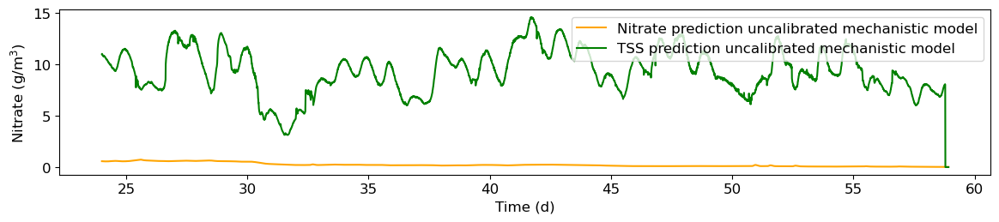

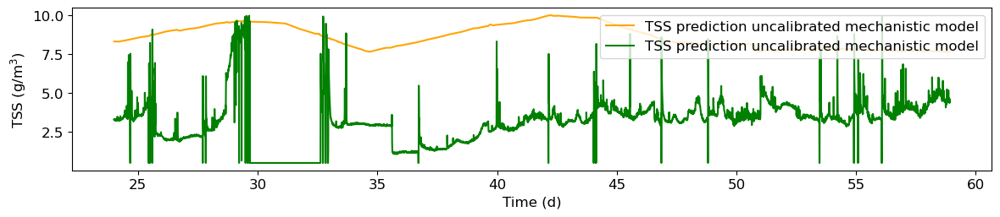

In [13]:
plt.rcParams.update({'font.size':12})
figure(figsize=(14,2.5))
plt.plot(mech_model_output_data['.SST_1.C(S_NO3)(1)'][24:], color='orange', label='Nitrate prediction uncalibrated mechanistic model')
plt.plot(measured_data['.SST_1.C(S_NO3)(1)'][24:], 'g', label='TSS prediction uncalibrated mechanistic model')
plt.xlabel('Time (d)')
plt.ylabel(r'Nitrate (g/m$^3$)')
plt.legend (loc='best')
plt.show()

plt.rcParams.update({'font.size': 12})
figure(figsize=(14,2.5))
plt.plot(mech_model_output_data['.SST_1.X_Layer(1)'][24:], 'orange', label='TSS prediction uncalibrated mechanistic model')
plt.plot(measured_data['.SST_1.X_Out'][24:], 'g', label='TSS prediction uncalibrated mechanistic model')

plt.xlabel('Time (d)')
plt.ylabel(r'TSS (g/m$^3$)')
plt.legend (loc='upper right')
plt.show()

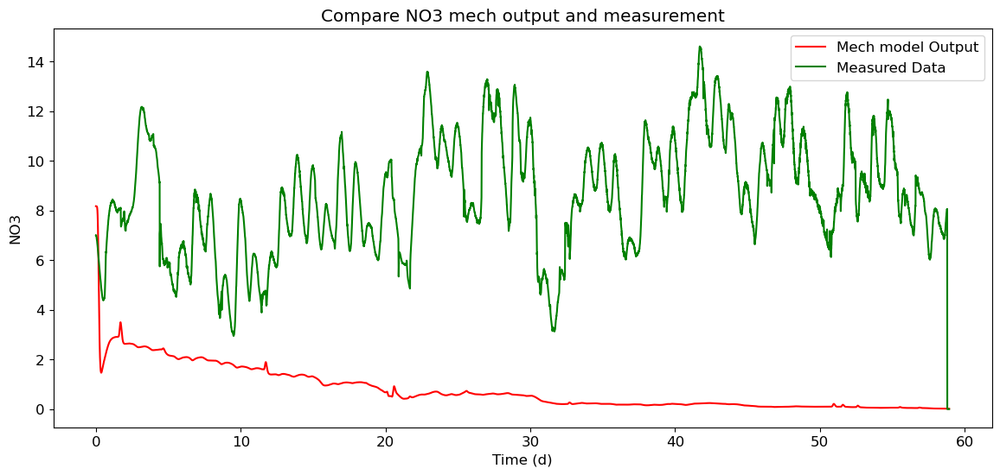

In [14]:
import matplotlib.pyplot as plt

mech=mech_model_output_data
measured=measured_data

figure(figsize=(14,6))
plt.plot(mech['.SST_1.C(S_NO3)(1)'], color='r', label='Mech model Output')
plt.plot(measured['.SST_1.C(S_NO3)(1)'], 'g', label='Measured Data')
plt.ylabel('NO3')
plt.xlabel('Time (d)')
plt.legend(loc='best')
plt.title('Compare NO3 mech output and measurement')
plt.show()

#  Import influent data (non fractionated)


In [15]:
# Set path to file
influent_data_path=r"C:\Users\Hoofdgebruiker\THESIS\influent_variabelen_doorGamzegesmooth.txt"

# Import file
influent_data0=pd.read_csv(influent_data_path, sep="\t", header=[0])
influent_data0=influent_data0.set_index('tijd(d)')
influent_data0 = influent_data0.astype(float)

# interpolate the influent data to the timesteps of the measured data
influent_data0=interp(influent_data0, interpol_index)

# Set path to file
Qair_data_path="C:\\Users\\Public\\Documents\\DHI\\WEST\\2022\\data\\projects\\data_gamze - ORIGINEEL\\pilEAUte model_Oct2022\\nieuwe_data_Loes\\Qair.txt"

# Import file
Qair_data=pd.read_csv(Qair_data_path, sep="\t", header=[2])
Qair_data=Qair_data.drop(0)
Qair_data=Qair_data.drop(1)
Qair_data=Qair_data.set_index('t ')
Qair_data = Qair_data.astype(float)

# interpolate the influent data to the timesteps of the measured data
Qair_data=interp(Qair_data, interpol_index)

# Set path to file
temp_data_path=data_filepath=r"C:\Users\Hoofdgebruiker\Development\data_filters\data\influent_data_Temp_filtered.csv"

# Import file
temp_data=pd.read_csv(temp_data_path, header=[0])['smoothed']
temp_data=np.array(temp_data.interpolate(method='linear', limit_direction='both'))

# create the training dataset: I used all the influent data plus the error in this script
influent_data=influent_data0.copy()
influent_data.insert(0, 'Qair', Qair_data)
influent_data.insert(0, 'Temp', temp_data)
display(influent_data)

,Temp,Qair,CODs_prim_infl,NH4_prim_infl,CODt_prim_infl,TSS_prim_infl,pH_prim_infl
tijd(d),,,,,,,
0.000000,20.301446,331.000000,147.168229,54.214033,396.877641,82.196048,7.550000
0.007056,20.301446,325.240122,145.926208,53.996000,388.654770,83.089431,7.539400
0.014111,20.301446,324.853530,143.419752,53.729801,381.349876,81.713018,7.532199
0.021167,20.307025,321.373821,141.858808,53.321340,378.993129,81.472128,7.509301
0.028222,20.312737,319.786870,141.456084,52.863486,376.778210,80.734739,7.517699
...,...,...,...,...,...,...,...
58.892578,17.954180,102.312099,194.531516,21.189862,312.157207,49.569675,7.440000
58.899633,17.956967,103.832428,194.531516,21.189862,312.157207,49.569675,7.440000
58.906689,17.960114,103.264108,194.531516,21.189862,312.157207,49.569675,7.440000


In [16]:
influent_data.iplot(kind='scatter',filename='cufflinks/simple-scatter',mode='lines', size=4,legend=True)

In [17]:
# Set path to files
output_name2=r"C:\Users\Public\Documents\DHI\WEST\2022\data\projects\data_gamze - ORIGINEEL\pilEAUte model_Oct2022\pilEAUte_model_ver04\testausel25_06.out_metlayer1.txt"

# Import files
originele_mech_model_output_data=pd.read_csv(output_name2, sep="\t",header=[0], low_memory=False)
originele_mech_model_output_data=originele_mech_model_output_data.drop(0)
originele_mech_model_output_data=originele_mech_model_output_data.drop(originele_mech_model_output_data.index[-1])
originele_mech_model_output_data=originele_mech_model_output_data.set_index('#.t')
originele_mech_model_output_data = originele_mech_model_output_data.astype(float)

# interpolate the mechanistic output data to the timesteps of the measured data
originele_mech_model_output_data=interp(originele_mech_model_output_data, interpol_index)

display(originele_mech_model_output_data)

,.ASU_2.X_TSS,.ASU_4.C(S_O),.Qair_Basin_4,.SST_1.C(S_NH)(1),.SST_1.C(S_NO3)(1),.SST_1.X_Layer(1),.SST_1.X_Out,.SST_1.X_Under
#.t,,,,,,,,
0.000000,2262.953200,3.000153,94.970918,0.242932,8.170881,6.395013,6.395013,4375.893200
0.007056,2262.409742,2.211630,249.954050,0.242934,8.170891,6.395038,6.395038,4375.935987
0.014111,2261.507608,2.193822,260.536726,0.242932,8.170894,6.395066,6.395066,4381.122029
0.021167,2260.596888,2.206032,265.364644,0.242924,8.170889,6.395309,6.395309,4401.119428
0.028222,2260.069914,2.213453,271.013973,0.242909,8.170877,6.396849,6.396849,4428.098425
...,...,...,...,...,...,...,...,...
58.892578,2069.616596,2.977911,213.549330,0.245944,3.749138,8.009434,8.009434,4102.389164
58.899633,2069.654676,2.977599,213.807363,0.244234,3.747658,8.009518,8.009518,4102.441812
58.906689,2069.694820,2.977274,214.070675,0.242527,3.744804,8.009628,8.009628,4102.499276


# Test 1: NO3 prediction

## Prepare the data for model input

In [18]:
from keras.models import Sequential
from keras.layers import LSTM, SimpleRNN
from keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from tensorflow.keras.optimizers import Adam, SGD 
import tensorflow as tf
from tensorflow import keras
import keras_tuner
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Conv2D, MaxPooling2D

In [19]:
# Create error = error that the mechanistic model makes at each timestep
error_for_training=measured_data['.SST_1.C(S_NO3)(1)']-mech_model_output_data['.SST_1.C(S_NO3)(1)']
error_for_training.describe()

count    8352.000000
mean        7.837359
std         2.732877
min        -1.410022
25%         5.890501
50%         8.058086
75%         9.836979
max        14.375709
Name: .SST_1.C(S_NO3)(1), dtype: float64

In [20]:
# create the training dataset: I used all the influent data plus the error in this script
df_for_training=influent_data.copy()
df_for_training.insert(0, 'error', error_for_training)
NO3=mech_model_output_data['.SST_1.C(S_NO3)(1)']
df_for_training.insert(1, 'NO3', NO3)

display(df_for_training)

,error,NO3,Temp,Qair,CODs_prim_infl,NH4_prim_infl,CODt_prim_infl,TSS_prim_infl,pH_prim_infl
tijd(d),,,,,,,,,
0.000000,-1.175681,8.170881,20.301446,331.000000,147.168229,54.214033,396.877641,82.196048,7.550000
0.007056,-1.176780,8.170847,20.301446,325.240122,145.926208,53.996000,388.654770,83.089431,7.539400
0.014111,-1.170326,8.170610,20.301446,324.853530,143.419752,53.729801,381.349876,81.713018,7.532199
0.021167,-1.177343,8.170113,20.307025,321.373821,141.858808,53.321340,378.993129,81.472128,7.509301
0.028222,-1.195871,8.169371,20.312737,319.786870,141.456084,52.863486,376.778210,80.734739,7.517699
...,...,...,...,...,...,...,...,...,...
58.892578,-0.018130,0.018130,17.954180,102.312099,194.531516,21.189862,312.157207,49.569675,7.440000
58.899633,-0.018124,0.018124,17.956967,103.832428,194.531516,21.189862,312.157207,49.569675,7.440000
58.906689,-0.018117,0.018117,17.960114,103.264108,194.531516,21.189862,312.157207,49.569675,7.440000


In [21]:
# Split the dataset
# trainX_temp=df_for_training[33120:66241] # calibration dataset Gamze
# validationX_temp=df_for_training[66240:76240] # half of the validation dataset Gamze
# testX_temp=df_for_training[76240:] # half of the validation dataset Gamze

tr1=24
tr2=42

v1=42
v2=47

te1=47
te2=59

trainX_temp=df_for_training.loc[tr1:tr2] #calib and half of valid
validationX_temp=df_for_training.loc[v1:v2] 
testX_temp=df_for_training.loc[te1:te2] 

testX_temp

,error,NO3,Temp,Qair,CODs_prim_infl,NH4_prim_infl,CODt_prim_infl,TSS_prim_infl,pH_prim_infl
tijd(d),,,,,,,,,
47.003996,12.338412,0.089888,19.505283,319.000000,83.598996,44.903074,275.596078,75.060007,7.336541
47.011051,12.366582,0.090028,19.511011,317.557856,83.028751,44.710686,275.082119,75.239569,7.345930
47.018107,12.315546,0.090164,19.517392,315.073516,81.502391,44.592011,272.883884,74.872947,7.344870
47.025162,12.407021,0.090296,19.524253,314.803964,80.505521,44.529597,269.042191,72.616962,7.344330
47.032218,12.347064,0.090424,19.531553,330.582881,80.811056,44.525694,266.602402,71.718321,7.340000
...,...,...,...,...,...,...,...,...,...
58.892578,-0.018130,0.018130,17.954180,102.312099,194.531516,21.189862,312.157207,49.569675,7.440000
58.899633,-0.018124,0.018124,17.956967,103.832428,194.531516,21.189862,312.157207,49.569675,7.440000
58.906689,-0.018117,0.018117,17.960114,103.264108,194.531516,21.189862,312.157207,49.569675,7.440000


In [22]:
# Scale the datasets, here I only scaled the influent data, not the error
scaler1=StandardScaler()
train_transformed=scaler1.fit_transform(trainX_temp.loc[:, trainX_temp.columns!= 'error'])
scaler2=StandardScaler()
val_transformed=scaler2.fit_transform(validationX_temp.loc[:, validationX_temp.columns!= 'error']) 
scaler3=StandardScaler()
test_transformed=scaler3.fit_transform(testX_temp.loc[:, testX_temp.columns!= 'error']) 

trainX_scaled=np.append(np.asarray(trainX_temp['error']).reshape(len(trainX_temp),1), train_transformed, axis=1).reshape(len(trainX_temp),df_for_training.shape[1])
validationX_scaled=np.append(np.asarray(validationX_temp['error']).reshape(len(validationX_temp),1), val_transformed, axis=1).reshape(len(validationX_temp),df_for_training.shape[1])
testX_scaled=np.append(np.asarray(testX_temp['error']).reshape(len(testX_temp),1), test_transformed, axis=1).reshape(len(testX_temp),df_for_training.shape[1])

In [23]:
# Prepare traindata for training
trainX=[]
trainY=[]

n_past=30# how much data point do you look back to make your next prediction

for i in range(n_past, len(trainX_scaled)):
    trainX.append(trainX_scaled[i-n_past:i, 1:]) # so here I did not include the errors in the training dataset
    trainY.append(trainX_scaled[i:i+1,0])
    
trainX, trainY = np.array(trainX), np.array(trainY)

# Check the shape of the traindata
print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape)) # the first line of data doesn't get predicted

trainX shape == (2521, 30, 8).
trainY shape == (2521, 1).


In [24]:
# Prepare validationdataset
validationX=[]
validationY=[]

for i in range(n_past, len(validationX_scaled)):
    validationX.append(validationX_scaled[i-n_past:i, 1:]) #don't include the predicted error
    validationY.append(validationX_scaled[i:i+1,0]) # je begint dus pas te voorspellen op de n_past-ste plaats
    
validationX, validationY = np.array(validationX), np.array(validationY)

# Check the shape of the validation datasets
print('validationX shape == {}.'.format(validationX.shape))
print('validationY shape == {}.'.format(validationY.shape))

# dus validationX[0] ingeven geeft een predictie van de lijn die zal bijgevoegd worden als laatste bij validationX[1]

validationX shape == (679, 30, 8).
validationY shape == (679, 1).


In [25]:
# Prepare validationdataset
testX=[]
testY=[]

for i in range(n_past, len(testX_scaled)):
    testX.append(testX_scaled[i-n_past:i, 1:]) #don't include the predicted error
    testY.append(testX_scaled[i:i+1,0]) # je begint dus pas te voorspellen op de n_past-ste plaats
    
testX, testY = np.array(testX), np.array(testY)

# Check the shape of the validation datasets
print('testX shape == {}.'.format(testX.shape))
print('testY shape == {}.'.format(testY.shape))

testX shape == (1660, 30, 8).
testY shape == (1660, 1).


## Model training

In [179]:
model=Sequential()
model.add(LSTM(units=10, input_shape=(trainX.shape[1], trainX.shape[2]), activation='relu', return_sequences=False))
model.add(Dropout(0.1, seed=42))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=0.0001), loss='mae')
model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LSTM)              (None, 10)                760       
                                                                 
 dropout_13 (Dropout)        (None, 10)                0         
                                                                 
 dense_11 (Dense)            (None, 1)                 11        
                                                                 
Total params: 771
Trainable params: 771
Non-trainable params: 0
_________________________________________________________________


In [180]:
# Train the model
history=model.fit(x=trainX, y=trainY, validation_data=(validationX, validationY), epochs=300, batch_size=64, shuffle=False, verbose=1)

Epoch 1/300
40/40 [==============================] - 5s 18ms/step - loss: 8.3004 - val_loss: 9.9809
Epoch 2/300
40/40 [==============================] - 1s 16ms/step - loss: 8.2257 - val_loss: 9.9285
Epoch 3/300
40/40 [==============================] - 0s 11ms/step - loss: 8.1780 - val_loss: 9.8791
Epoch 4/300
40/40 [==============================] - 0s 11ms/step - loss: 8.1283 - val_loss: 9.8300
Epoch 5/300
40/40 [==============================] - 0s 11ms/step - loss: 8.0593 - val_loss: 9.7806
Epoch 6/300
40/40 [==============================] - 1s 13ms/step - loss: 7.9930 - val_loss: 9.7298
Epoch 7/300
40/40 [==============================] - 0s 12ms/step - loss: 7.8986 - val_loss: 9.6782
Epoch 8/300
40/40 [==============================] - 1s 13ms/step - loss: 7.8360 - val_loss: 9.6235
Epoch 9/300
40/40 [==============================] - 0s 12ms/step - loss: 7.7574 - val_loss: 9.5658
Epoch 10/300
40/40 [==============================] - 0s 12ms/step - loss: 7.7190 - val_loss: 9.5055

40/40 [==============================] - 0s 11ms/step - loss: 3.0656 - val_loss: 4.4965
Epoch 83/300
40/40 [==============================] - 0s 11ms/step - loss: 3.0167 - val_loss: 4.4341
Epoch 84/300
40/40 [==============================] - 0s 11ms/step - loss: 3.0729 - val_loss: 4.3721
Epoch 85/300
40/40 [==============================] - 1s 13ms/step - loss: 2.9730 - val_loss: 4.3336
Epoch 86/300
40/40 [==============================] - 1s 14ms/step - loss: 2.9809 - val_loss: 4.3080
Epoch 87/300
40/40 [==============================] - 1s 17ms/step - loss: 2.9450 - val_loss: 4.2671
Epoch 88/300
40/40 [==============================] - 1s 24ms/step - loss: 3.0034 - val_loss: 4.2250
Epoch 89/300
40/40 [==============================] - 1s 17ms/step - loss: 2.8840 - val_loss: 4.1733
Epoch 90/300
40/40 [==============================] - 1s 14ms/step - loss: 2.8765 - val_loss: 4.1443
Epoch 91/300
40/40 [==============================] - 0s 12ms/step - loss: 2.8756 - val_loss: 4.1010
Epo

40/40 [==============================] - 0s 11ms/step - loss: 1.9417 - val_loss: 3.8558
Epoch 163/300
40/40 [==============================] - 0s 12ms/step - loss: 1.9452 - val_loss: 3.8863
Epoch 164/300
40/40 [==============================] - 0s 11ms/step - loss: 1.9530 - val_loss: 3.9005
Epoch 165/300
40/40 [==============================] - 0s 11ms/step - loss: 1.8960 - val_loss: 3.8334
Epoch 166/300
40/40 [==============================] - 0s 11ms/step - loss: 1.9268 - val_loss: 3.9211
Epoch 167/300
40/40 [==============================] - 0s 11ms/step - loss: 1.8583 - val_loss: 3.8605
Epoch 168/300
40/40 [==============================] - 0s 11ms/step - loss: 1.9522 - val_loss: 3.8866
Epoch 169/300
40/40 [==============================] - 0s 11ms/step - loss: 1.8741 - val_loss: 3.8280
Epoch 170/300
40/40 [==============================] - 0s 11ms/step - loss: 1.8631 - val_loss: 3.8992
Epoch 171/300
40/40 [==============================] - 0s 12ms/step - loss: 1.8704 - val_loss: 3

40/40 [==============================] - 0s 11ms/step - loss: 1.5482 - val_loss: 2.6377
Epoch 243/300
40/40 [==============================] - 0s 12ms/step - loss: 1.5214 - val_loss: 2.6412
Epoch 244/300
40/40 [==============================] - 0s 11ms/step - loss: 1.5253 - val_loss: 2.5868
Epoch 245/300
40/40 [==============================] - 0s 11ms/step - loss: 1.5181 - val_loss: 2.5514
Epoch 246/300
40/40 [==============================] - 1s 13ms/step - loss: 1.4599 - val_loss: 2.6027
Epoch 247/300
40/40 [==============================] - 0s 12ms/step - loss: 1.4960 - val_loss: 2.5527
Epoch 248/300
40/40 [==============================] - 0s 11ms/step - loss: 1.4980 - val_loss: 2.5084
Epoch 249/300
40/40 [==============================] - 0s 12ms/step - loss: 1.4707 - val_loss: 2.5591
Epoch 250/300
40/40 [==============================] - 0s 11ms/step - loss: 1.4865 - val_loss: 2.5354
Epoch 251/300
40/40 [==============================] - 0s 11ms/step - loss: 1.4778 - val_loss: 2

Text(0, 0.5, 'loss')

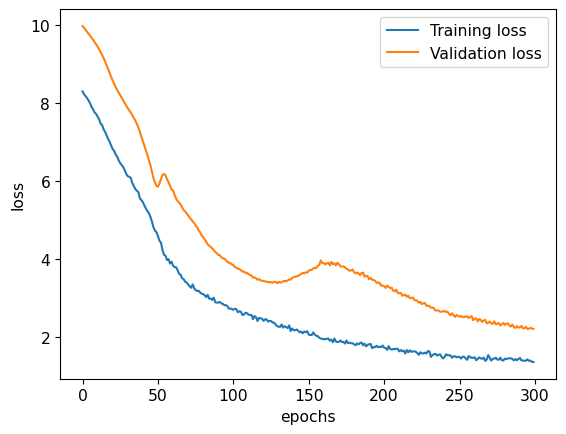

In [182]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')

In [183]:
n_past_metrics=30
n_temp=n_past_metrics-n_past

## Training data prediction

### Make predictions of the error

In [184]:
predictions=model.predict(trainX)

79/79 [==============================] - 0s 3ms/step


### Add predicted error to output mechanistic model

In [185]:
# Select the NO3 mechanistic model output for the training period
output_NO3=mech_model_output_data['.SST_1.C(S_NO3)(1)']
training_mech_output_NO3=output_NO3.loc[tr1:tr2] # first one not included because this doesn't get predicted 
training_mech_output_NO3=np.array(training_mech_output_NO3.iloc[n_past_metrics:])

# Add predicted error to output mechanistic model
training_hybrid_output_NO3=np.asarray(predictions[n_temp:]).reshape(len(predictions[n_temp:]),)+ training_mech_output_NO3

# Select the measured NO3 for the training period
training_measured_NO3=measured_data['.SST_1.C(S_NO3)(1)'].loc[tr1:tr2]
training_measured_NO3=np.array(training_measured_NO3.iloc[n_past_metrics:])

originele_output_NO3=originele_mech_model_output_data['.SST_1.C(S_NO3)(1)']
originele_training_mech_output_NO3=originele_output_NO3.loc[tr1:tr2] # first one not included because this doesn't get predicted 
originele_training_mech_output_NO3=np.array(originele_training_mech_output_NO3.iloc[n_past_metrics:])


### Check results training dataset prediction

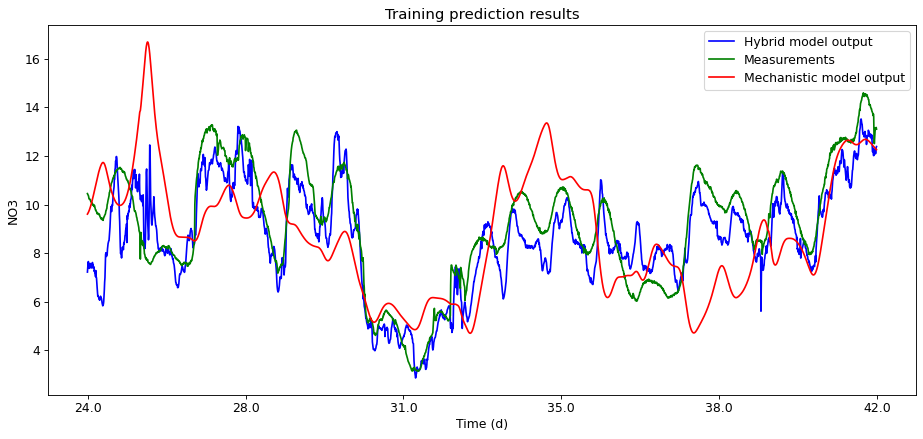

In [186]:
figure(figsize=(14, 6), dpi=80)
plt.plot(training_hybrid_output_NO3,'b',label='Hybrid model output')
plt.plot(training_measured_NO3, 'g', label='Measurements')
plt.plot(originele_training_mech_output_NO3, 'r', label='Mechanistic model output')
plt.xticks(ticks=np.linspace(1,len(training_hybrid_output_NO3), 6) , labels=np.around(np.linspace(float(trainX_temp.index[1]), float(trainX_temp.index[-1]), 6)))
plt.legend()
plt.xlabel('Time (d)')
plt.ylabel('NO3')
plt.title('Training prediction results')
plt.savefig('training.png')

#Experiment.log_figure(experiment, figure_name='training results')

In [187]:
print('Training prediction results')
mse_hybrid_tr = sklearn.metrics.mean_squared_error(training_measured_NO3, training_hybrid_output_NO3)  
rmse_hybrid_tr = math.sqrt(mse_hybrid_tr)  

som=0
n=len(training_hybrid_output_NO3)
for i in range(n):
    som += abs(training_measured_NO3[i] - training_hybrid_output_NO3[i])

mae_hybrid_tr=som/n

print("Hybrid model: MAE:", mae_hybrid_tr) 
print("Hybrid model: MSE:", mse_hybrid_tr)
print("Hybrid model: RMSE:", rmse_hybrid_tr)  


mse_mech_tr = sklearn.metrics.mean_squared_error(training_measured_NO3, originele_training_mech_output_NO3)  
rmse_mech_tr = math.sqrt(mse_mech_tr) 

som2=0
n=len(originele_training_mech_output_NO3)
for i in range(n):
    som2 += abs(training_measured_NO3[i] - originele_training_mech_output_NO3[i])

mae_mech_tr=som2/n

print("Mechanistic model: MAE:", mae_mech_tr) 
print("Mechanistic model: MSE:", mse_mech_tr)
print("Mechanistic model: RMSE:", rmse_mech_tr)

Training prediction results
Hybrid model: MAE: 0.9899246276102722
Hybrid model: MSE: 1.4674542176837737
Hybrid model: RMSE: 1.211385247427
Mechanistic model: MAE: 1.970311545182247
Mechanistic model: MSE: 6.237352184319416
Mechanistic model: RMSE: 2.49746915582944


## Validation data prediction

### Make prediction of the errors

In [188]:
predictions_val=model.predict(validationX)

22/22 [==============================] - 0s 4ms/step


### Add predicted error to output mechanistic model

In [189]:
# Select the NO3 mechanistic model output for the validation period
output_NO3=mech_model_output_data['.SST_1.C(S_NO3)(1)']
validation_mech_output_NO3=output_NO3.loc[v1:v2] 
validation_mech_output_NO3=np.array(validation_mech_output_NO3.iloc[n_past_metrics:])

# Add predicted error to output mechanistic model
validation_hybrid_output_NO3=np.asarray(predictions_val[n_temp:]).reshape(len(predictions_val[n_temp:]),) + validation_mech_output_NO3

# Select the measured NO3 for the validation period
validation_measured_NO3=measured_data['.SST_1.C(S_NO3)(1)'][v1:v2]
validation_measured_NO3=np.array(validation_measured_NO3.iloc[n_past_metrics:])

originele_output_NO3=originele_mech_model_output_data['.SST_1.C(S_NO3)(1)']
originele_validation_mech_output_NO3=originele_output_NO3.loc[v1:v2] 
originele_validation_mech_output_NO3=np.array(originele_validation_mech_output_NO3.iloc[n_past_metrics:])

### Check results validation dataset prediction

Text(0.5, 1.0, 'Validation period')

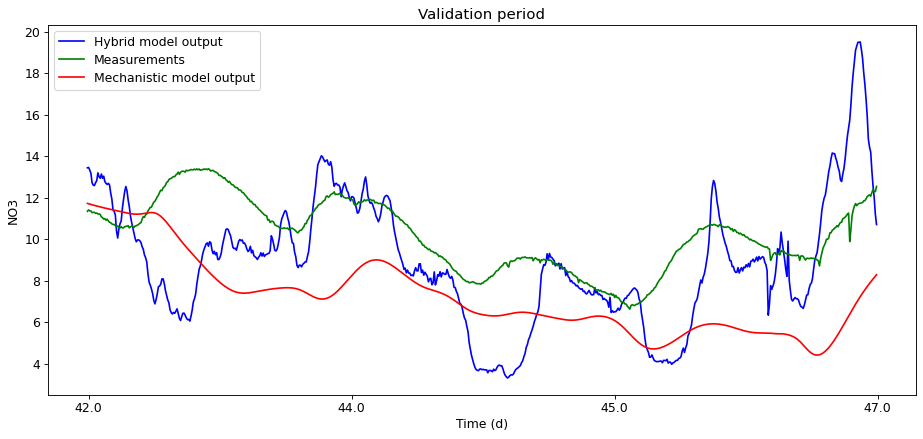

In [190]:
figure(figsize=(14, 6), dpi=80)

plt.plot(validation_hybrid_output_NO3,'b',label='Hybrid model output')
plt.plot(validation_measured_NO3, 'g', label='Measurements')
plt.plot(originele_validation_mech_output_NO3, 'r', label='Mechanistic model output')
plt.xticks(ticks=np.linspace(1, len(validation_hybrid_output_NO3),4) , labels=np.around(np.linspace(float(validationX_temp.index[1]), float(validationX_temp.index[-1]), 4)))
plt.legend()
plt.xlabel('Time (d)')
plt.ylabel('NO3')
plt.title('Validation period')

#Experiment.log_figure(experiment,figure_name='validation results')

In [191]:
print('Validation results')
mse_hybrid_val = sklearn.metrics.mean_squared_error(validation_measured_NO3, validation_hybrid_output_NO3)  
rmse_hybrid_val = math.sqrt(mse_hybrid_val)  

print("Hybrid model: MSE:", mse_hybrid_val)
print("Hybrid model: RMSE:", rmse_hybrid_val)  

mse_mech_val = sklearn.metrics.mean_squared_error(validation_measured_NO3, originele_validation_mech_output_NO3)  
rmse_mech_val = math.sqrt(mse_mech_val)  

print("Mechanistic model: MSE:", mse_mech_val)
print("Mechanistic model: RMSE:", rmse_mech_val)

Validation results
Hybrid model: MSE: 8.385913963195033
Hybrid model: RMSE: 2.89584425741355
Mechanistic model: MSE: 11.410297063841485
Mechanistic model: RMSE: 3.377913122601214


## Test data prediction

### Make prediction of the errors

In [192]:
predictions_test=model.predict(testX)

52/52 [==============================] - 0s 3ms/step


### Add predicted error to output mechanistic model

In [193]:

# Select the NO3 mechanistic model output for the validation period
output_NO3=mech_model_output_data['.SST_1.C(S_NO3)(1)']
test_mech_output_NO3=output_NO3[te1:te2] 
test_mech_output_NO3=np.array(test_mech_output_NO3.iloc[n_past_metrics:])

# Add predicted error to output mechanistic model
test_hybrid_output_NO3=np.asarray(predictions_test[n_temp:]).reshape(len(predictions_test[n_temp:]) ,) + test_mech_output_NO3

# Select the measured NO3 for the validation period
test_measured_NO3=measured_data['.SST_1.C(S_NO3)(1)'][te1:te2]
test_measured_NO3=np.array(test_measured_NO3.iloc[n_past_metrics:])

originele_output_NO3=originele_mech_model_output_data['.SST_1.C(S_NO3)(1)']
originele_test_mech_output_NO3=originele_output_NO3[te1:te2] 
originele_test_mech_output_NO3=np.array(originele_test_mech_output_NO3.iloc[n_past_metrics:])

### Check results test dataset prediction

Text(0.5, 1.0, 'Test period')

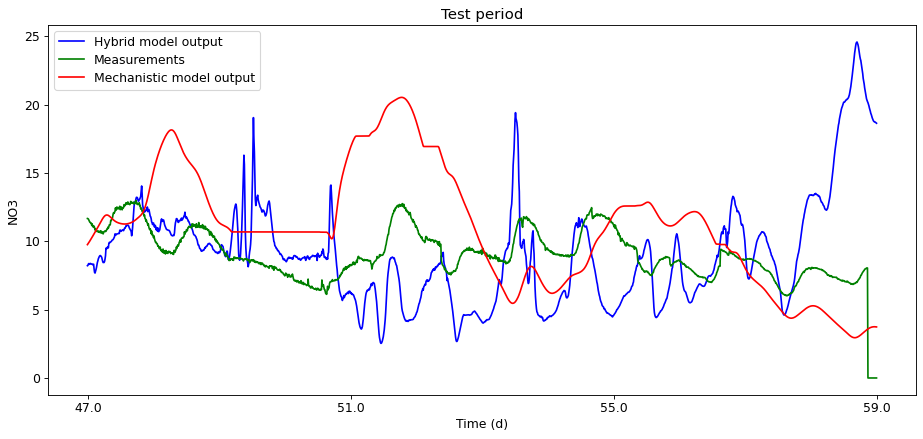

In [194]:
figure(figsize=(14, 6), dpi=80)

plt.plot(test_hybrid_output_NO3,'b',label='Hybrid model output')
plt.plot(test_measured_NO3, 'g', label='Measurements')
plt.plot(originele_test_mech_output_NO3, 'r', label='Mechanistic model output')
plt.xticks(ticks=np.linspace(1,len(test_hybrid_output_NO3),4) , labels=np.around(np.linspace(float(testX_temp.index[1]), float(testX_temp.index[-1]), 4)))
plt.legend()
plt.xlabel('Time (d)')
plt.ylabel('NO3')
plt.title('Test period')


#Experiment.log_figure(experiment,figure_name='test results')


#shapley values (code van Ward)
#matlab ook eens bekijken -> eerst doen
#gamze met default parameters (Elena bekijkt kalibratieprocedure)
#marcello's data gebruiken? -> eens vragen of we data mogen gebruiken
#Christian -> hyperparametertraining
#drop is niet natuurlijk

#nadien serie model (als parallel redelijk werkt)

In [195]:
print('test results')
mse_hybrid_te = sklearn.metrics.mean_squared_error(test_measured_NO3, test_hybrid_output_NO3)  
rmse_hybrid_te = math.sqrt(mse_hybrid_te)  

print("Hybrid model: MSE:", mse_hybrid_te)
print("Hybrid model: RMSE:", rmse_hybrid_te)  

mse_mech_te = sklearn.metrics.mean_squared_error(test_measured_NO3, originele_test_mech_output_NO3)  
rmse_mech_te = math.sqrt(mse_mech_te)  

print("Mechanistic model: MSE:", mse_mech_te)
print("Mechanistic model: RMSE:", rmse_mech_te)

test results
Hybrid model: MSE: 23.070320286728567
Hybrid model: RMSE: 4.8031573247946575
Mechanistic model: MSE: 19.07765668424781
Mechanistic model: RMSE: 4.367797692687678


In [196]:
# experiment.end()

(0.0, 31.0)

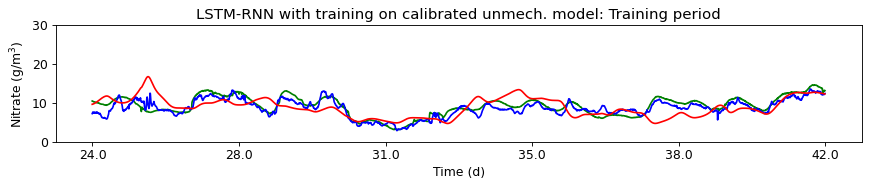

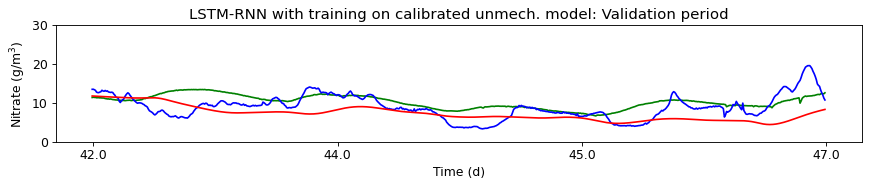

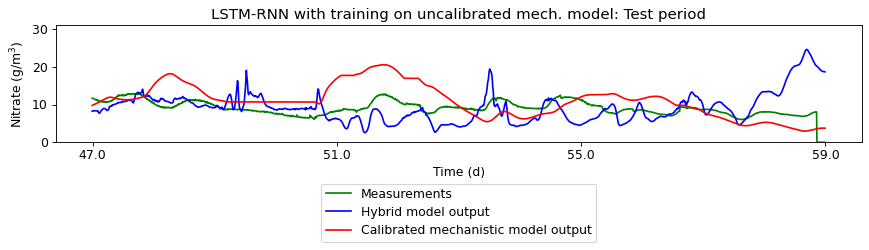

In [197]:
plt.rcParams.update({'font.size': 11.2})

figure(figsize=(13,1.9), dpi=80)
plt.plot(training_measured_NO3, 'g', label='Measurements')
plt.plot(training_hybrid_output_NO3,'b', label='Hybrid model output')
plt.plot(originele_training_mech_output_NO3, 'r', label='Calibrated mechanistic model output')
plt.xticks(ticks=np.linspace(1,len(training_hybrid_output_NO3), 6) , labels=np.around(np.linspace(float(trainX_temp.index[1]), float(trainX_temp.index[-1]), 6)))
plt.xlabel('Time (d)')
plt.ylabel(r'Nitrate (g/m$^3$)')
plt.title('LSTM-RNN with training on calibrated unmech. model: Training period')
plt.ylim([0,30])

figure(figsize=(13,1.9), dpi=80)
plt.plot(validation_measured_NO3, 'g', label='Measurements')
plt.plot(validation_hybrid_output_NO3,'b',label='Hybrid model output')
plt.plot(originele_validation_mech_output_NO3, 'r', label='Mechanistic model output with calibrated parameters')
plt.xticks(ticks=np.linspace(1, len(validation_hybrid_output_NO3),4) , labels=np.around(np.linspace(float(validationX_temp.index[1]), float(validationX_temp.index[-1]), 4)))
plt.xlabel('Time (d)')
plt.ylabel(r'Nitrate (g/m$^3$)')
plt.title('LSTM-RNN with training on calibrated unmech. model: Validation period')
plt.ylim([0,30])

figure(figsize=(13,1.9), dpi=80)
plt.plot(test_measured_NO3, 'g', label='Measurements')
plt.plot(test_hybrid_output_NO3,'b',label='Hybrid model output')
plt.plot(originele_test_mech_output_NO3, 'r', label='Calibrated mechanistic model output')
plt.xticks(ticks=np.linspace(1,len(test_hybrid_output_NO3),4) , labels=np.around(np.linspace(float(testX_temp.index[1]), float(testX_temp.index[-1]), 4)))
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=1)
plt.xlabel('Time (d)')
plt.ylabel(r'Nitrate (g/m$^3$)')
plt.title('LSTM-RNN with training on uncalibrated mech. model: Test period')
plt.ylim([0,31])

# Metrics

In [199]:
print('NO3: LSTM')
print('\nTraining prediction results')
mse_hybrid_tr = sklearn.metrics.mean_squared_error(training_measured_NO3, training_hybrid_output_NO3)  
rmse_hybrid_tr = math.sqrt(mse_hybrid_tr)  

print("Hybrid model: RMSE:", rmse_hybrid_tr)  

mse_mech_tr = sklearn.metrics.mean_squared_error(training_measured_NO3, originele_training_mech_output_NO3)  
rmse_mech_tr = math.sqrt(mse_mech_tr) 

print("Mechanistic model: RMSE:", rmse_mech_tr)

#___________________________________________________________________________________

print('\nValidation results')
mse_hybrid_val = sklearn.metrics.mean_squared_error(validation_measured_NO3, validation_hybrid_output_NO3)  
rmse_hybrid_val = math.sqrt(mse_hybrid_val)  

print("Hybrid model: RMSE:", rmse_hybrid_val)  

mse_mech_val = sklearn.metrics.mean_squared_error(validation_measured_NO3, originele_validation_mech_output_NO3)  
rmse_mech_val = math.sqrt(mse_mech_val)

print("Mechanistic model: RMSE:", rmse_mech_val)
#___________________________________________________________________________________

print('\nTest results')
mse_hybrid_te = sklearn.metrics.mean_squared_error(test_measured_NO3, test_hybrid_output_NO3)  
rmse_hybrid_te = math.sqrt(mse_hybrid_te)  

print("Hybrid model: RMSE:", rmse_hybrid_te)  

mse_mech_te = sklearn.metrics.mean_squared_error(test_measured_NO3, originele_test_mech_output_NO3)  
rmse_mech_te = math.sqrt(mse_mech_te)

print("Mechanistic model: RMSE:", rmse_mech_te)


NO3: LSTM

Training prediction results
Hybrid model: RMSE: 1.211385247427
Mechanistic model: RMSE: 2.49746915582944

Validation results
Hybrid model: RMSE: 2.89584425741355
Mechanistic model: RMSE: 3.377913122601214

Test results
Hybrid model: RMSE: 4.8031573247946575
Mechanistic model: RMSE: 4.367797692687678
